<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Комментарий ревьюера</b>


Привет, Игорь! Давай знакомиться! Меня зовут Дмитрий Махортов, и я буду проверять твой проект. Сразу предлагаю общение на «ты» 🙂, но если тебе это не комфортно, то дай знать, и мы перейдем на «вы». 


Моя основная цель — не указать на совершенные тобою ошибки, а поделиться своим опытом и помочь тебе погрузиться в увлекательный мир работы с данными и вырасти в крепкого профи. Это отдаленная цель. А ближайшая - сделать твою работу еще лучше )).
   
    
Все ключевые этапы в работе выполнены, и я вижу что с проектом ты справшяешься. Есть моменты, которые нужно доработать, но я уверен, у тебя все получится.
        
Расскажу как обычно проходит проверка:    
Бывают моменты, которые требуют пристального внимания. Комментарии по ним выделены <span style='background-color:#F7B3A4'> красным цветом </span> и обозначены значком 🛑. После их доработки проект будет принят.  🙂
 
<span style='background-color:#B7EBA7'> Зеленым цветом </span> и значком ✅ отмечены удачные и элегантные решения, на которые можно опираться в будущих проектах. Или советы «со звездочкой», которые помогут тебе в будущем.

<span style='background-color:#F9EDA6'>Жёлтым цветом </span> и значком ⚠️ выделено то, что в следующий раз можно сделать по-другому. Ты можешь учесть эти комментарии при выполнении будущих заданий или доработать проект сейчас (однако это не обязательно).

Давай работать над проектом в диалоге: **если ты что-то меняешь в проекте по моим рекомендациям — пиши об этом**. Выбери для своих комментариев какой-то заметный цвет, так мне будет легче отследить изменения. Пожалуйста, **не перемещай, не изменяй и не удаляй мои комментарии**. Всё это поможет выполнить повторную проверку твоего проекта оперативнее. 
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>образец комментария студента</b></font>
   
Можешь использовать этот комментарий. Просто удали этот текст и вместо него напиши свой 🙂

</div>

# Прекод

# Сборный проект-5

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 Да, это хорошая практика - дать описание контекста и проблемы, которую мы решаем. </div>

In [1]:
import pandas as pd
pd.set_option('display.max_colwidth', 100)

import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

import textwrap
from PIL import Image, ImageOps
import os
import numpy as np

from tqdm import tqdm
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GroupShuffleSplit, GroupKFold, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision.models import resnet18, ResNet18_Weights
from tqdm.auto import tqdm

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.resnet50 import preprocess_input

import nltk
nltk.download("wordnet")
nltk.download("stopwords")
nltk.download("averaged_perceptron_tagger_eng")
from nltk.corpus import stopwords, wordnet
from nltk.stem import WordNetLemmatizer

import re

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\1\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\1\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\1\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, все нужные библиотеки импортированы в начале ноутбука.Это хорошая практика.</div>

In [2]:
train_img_dir = "D:/Рабочий стол/to_upload/train_images"
test_img_dir = "D:/Рабочий стол/to_upload/test_images"

In [3]:
crowd_an = pd.read_csv('CrowdAnnotations.tsv',header=None, sep='\t')
expert_an = pd.read_csv('ExpertAnnotations.tsv',header=None, sep='\t')
test_im = pd.read_csv('test_images.csv')
test_q = pd.read_csv('test_queries.csv', sep='|', index_col=[0])
train_data = pd.read_csv('train_dataset.csv')

crowd_an = crowd_an.rename(columns={
    0: 'image',
    1: 'query_id',
    2:'ratio',
    3:'crowd_good',
    4:'crowd_bad'
})
crowd_an.info()
crowd_an.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       47830 non-null  object 
 1   query_id    47830 non-null  object 
 2   ratio       47830 non-null  float64
 3   crowd_good  47830 non-null  int64  
 4   crowd_bad   47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


,image,query_id,ratio,crowd_good,crowd_bad
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [4]:
expert_an = expert_an.rename(columns={
    0: 'image',
    1: 'query_id',
    2:'expert_1',
    3:'expert_2',
    4:'expert_3'
})
expert_an.info()
expert_an.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [5]:
train_data.info()
train_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .


In [6]:
test_im.info()
test_im.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


In [7]:
test_q.info()
test_q.head()

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .,1177994172_10d143cb8d.jpg


In [8]:
df = train_data.merge(expert_an, on=['image','query_id'], how='left')
df = df.merge(crowd_an, on=['image','query_id'], how='left')


df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   expert_1    5822 non-null   int64  
 4   expert_2    5822 non-null   int64  
 5   expert_3    5822 non-null   int64  
 6   ratio       2329 non-null   float64
 7   crowd_good  2329 non-null   float64
 8   crowd_bad   2329 non-null   float64
dtypes: float64(3), int64(3), object(3)
memory usage: 409.5+ KB


,image,query_id,query_text,expert_1,expert_2,expert_3,ratio,crowd_good,crowd_bad
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1,1,1,0.0,0.0,3.0
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1,1,1,NaN,NaN,NaN
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1,2,2,0.0,0.0,3.0
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,4,4,4,1.0,3.0,0.0
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1,1,1,NaN,NaN,NaN


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">

По объединению экспертных и крауд оценок все ОК, но подсвечу возможные альтернативы
    
--------------    
    
    
В этом проекте есть несколько возможных стратегий работы с обучающими и краудсорс оценками,  вот эти стратегии с плюсами и минусами:
   

   - использовать соединение через outer, в этом случае, при корректной обработке пропусков мы можем получить более 50К размеченых пар. К плюсам данного подхода можно отнести большое количество данных. Минус - в основном это будут данные, размеченные краудсорсерами, а там качество раметки ниже.
   - использовать только экспертные оценки. плюс - высокое качество данных (разметка имеет шкалу). Минус - данных меньше.  Поясню по поводу качества разметки на примере: если на изображении одна собака, а в описании "две собаки бегут по берегу", то эксперты поставять соответствие 0,6-0,7 (переводя в шкалу 0-1), а краудсорсеры поставят 0.  Но на экспертных оценках модель хотя-бы научится находить собак, а на краудсор оценках ничему не начится.

   - использование соединения через left.  Данный подход очевидно проигрывает второму варианту: данных столько же, нужно дополнительно возиться с объединением, но качество разметки снижается.. Но это соответсвует предложениям авторов проекта, поэтому такой подход имеет право на жизнь

   - объединение через inner. Тут все плохо - и данных ОЧЕНЬ мало (в два раза меньше, чем использовать только экспертные оценки) и качество у них "подпорчено". И навыков по обработке пропусков не получаем.....


</div>

**Вывод**\
В обучающей таблице сформировано 5 822 пары фото — текст. Для каждой пары доступны три экспертные оценки, однако краудсорсинговая разметка присутствует только у 2 329 объектов (около 40%). Поэтому при формировании целевой переменной основной источник информации для части наблюдений — экспертные оценки, а отсутствующие ответы крауда необходимо обрабатывать отдельно. Тестовый набор содержит 100 изображений и 500 запросов.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Все верно. Данные загружены, проведен первичный осмотр, сфомурилованы выводы </div>

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

----
**EDA**


<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>комментарий студента</b></font>
   
Привет! Добавил ЕDA

</div>

In [9]:
#df
print(' Кол-во уникальных фото в train_data:', df['image'].nunique(), '\n',
     'Кол-во уникальных запросов в train_data:', df['query_id'].nunique())
files = [f for f in os.listdir(train_img_dir) if os.path.isfile(os.path.join(train_img_dir, f))]

print(' Кол-во уникальных фото(из папки):', len(set(files)))

count = 0
none_exist_img = []

for i in train_data['image'].unique():
    if i in files:
        continue
    else:
        count+=1
        none_exist_img.append(i)
print(' Кол-во фотографий, которых нет в папке:', count)   
print(' Кол-во дубликатов train _data:', df[['image', 'query_id']].duplicated().sum())
print(f" Доля пропусков у краудов: {df['ratio'].isna().sum()/len(df) * 100:.2f}%")

 Кол-во уникальных фото в train_data: 1000 
 Кол-во уникальных запросов в train_data: 977
 Кол-во уникальных фото(из папки): 1000
 Кол-во фотографий, которых нет в папке: 0
 Кол-во дубликатов train _data: 0
 Доля пропусков у краудов: 60.00%


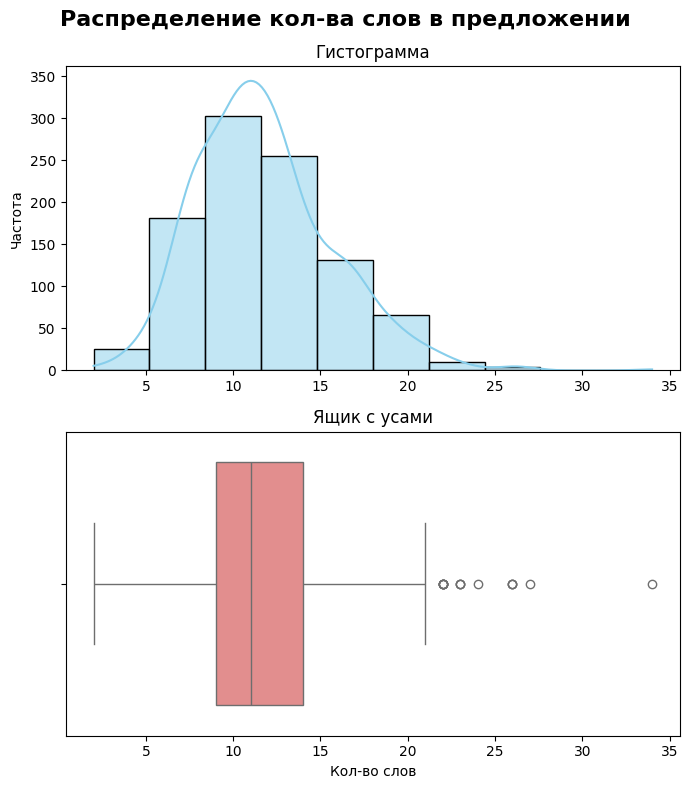

In [11]:


def num_visio(x, xlabel, title, bins=10, aggs = False):
    
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(7, 8))        
    fig.suptitle(title,fontsize=16, fontweight="bold", y=0.98)

    sns.histplot(x=x, bins=bins, kde=True, ax=axes[0], color='skyblue')
    axes[0].set_title('Гистограмма')
    axes[0].set_ylabel('Частота')
    axes[0].set_xlabel('')
    
    if aggs == True:
        axes[0].axvline(x.mean(), color='red', linestyle='--', linewidth=2, label=f'Среднее = {x.mean():.2f}')
        axes[0].axvline(x.median(), color='green', linestyle='--', linewidth=2, label=f'Медиана = {x.median():.2f}')
        axes[0].legend()
    
    sns.boxplot( x=x, ax=axes[1], color='lightcoral')
    axes[1].set_title('Ящик с усами')
    axes[1].set_xlabel(xlabel)
    plt.tight_layout()

    plt.show()
    
lens = [len(i.split()) for i in df['query_text'].unique() ]   
num_visio(lens, 'Кол-во слов', 'Распределение кол-ва слов в предложении')    

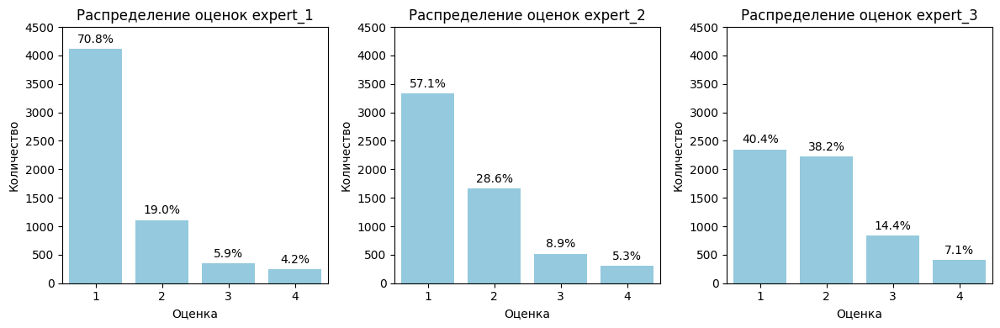

In [12]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))

cols = ['expert_1', 'expert_2', 'expert_3']

for ax, col in zip(axes, cols):
    counts = df[col].value_counts()
    perc = df[col].value_counts(normalize=True)

    sns.barplot(x=counts.index, y=counts.values,ax=ax,color='skyblue')
    ax.bar_label(ax.containers[0], labels=[f'{p:.1%}' for p in perc], padding=3)

    ax.set_title(f'Распределение оценок {col}')
    ax.set_xlabel('Оценка')
    ax.set_ylabel('Количество')
    ax.set_ylim(0, 4500)

plt.tight_layout()
plt.show()

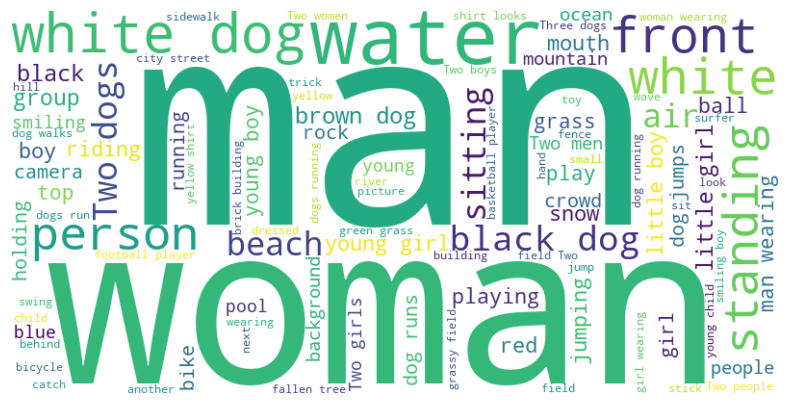

In [13]:
text_all = " ".join(train_data["query_text"].astype(str))
wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    max_words=100,
    colormap='viridis'
).generate(text_all)

plt.figure(figsize=(10, 5))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()


,query_text,expert_1,expert_2,expert_3
754,Naked people riding bikes .,1,1,2
1325,A person on the beach beside the ocean at sunset .,3,3,4
5239,A dog stands at the top of a mountain and looks on .,1,1,2


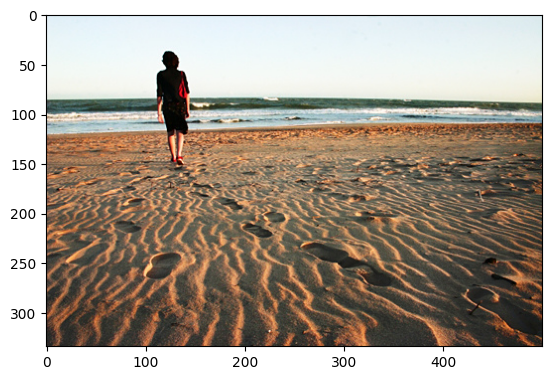

,query_text,expert_1,expert_2,expert_3
1348,a dog on the beach .,3,3,4
3348,Two dogs are running towards each other on a beach .,3,4,4
5453,A man is standing at the shoreline on the beach with 4 dogs .,2,2,2


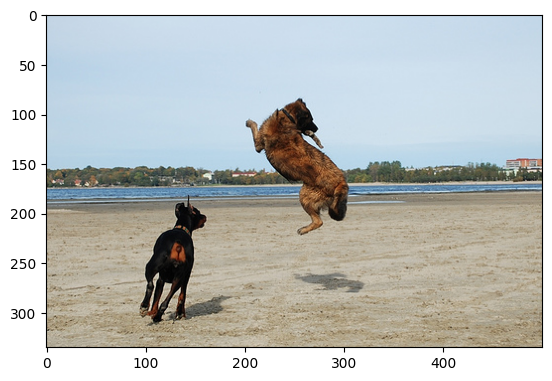

,query_text,expert_1,expert_2,expert_3
1358,A smaller art festival on the edge of a forest,1,1,1
2489,"Two dogs , identical white with brown spots wrestle on jet black sand .",1,1,1
4232,A man climbs up a sheer wall of ice .,2,2,3


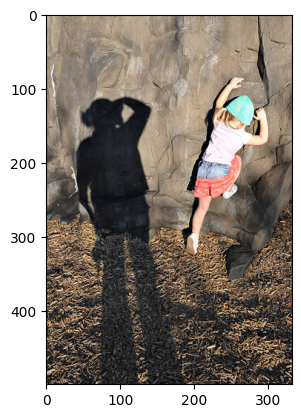

In [14]:
random_images = df['image'].drop_duplicates().sample(3, random_state=42)
for img in random_images:
    display(df[df['image']==img][['query_text','expert_1','expert_2','expert_3']].sample(3, random_state=42))
    img_path = os.path.join(train_img_dir, img)
    image = Image.open(img_path)
    plt.imshow(image)
    plt.show()  
    print('=' * 90)

**Вывод:**
 - Кол-во уникальных фото в тренировочной выборке соответсвует кол-ву изображений в папке (1000)
 - Всего 977 уникальных описаний
 - Средняя длина предложения примерно 13 слов
 - Наиболее часто встречающееся слова: woman, man, dog
 - Доля пропусков у краудов: 60.00%
 - Первый эксперт очень критичен к оценкам, 70% оценок - "описание не соответсвует изображению". 2 и 3 эксперты примерно полхожи в оценках. У всех экспертов преобладает оценка "1".
 - Изображения разного размера
 - Визуально посмотрев на 3 случайных изображения и их описания с оценками экспертов, можно подумать, что эксперт 1 склонен к занижению оценки, а эксперт 3 к завышению. Эксперт 2 находится где-то по середине.

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/c/cf/RomanianTrafficSign_30-Stop_1971.svg/250px-RomanianTrafficSign_30-Stop_1971.svg.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
    
Давай будем честными. Раздел связанный с исследовательским анализом данных (EDA) в проекте полностью отсутствует.
    
Проведено только первичное знакомство (head/info). 
    
Как должно выглядеть знакомство с данными после загрузки:
    
 - первичный осмотр и проверка качества. Именно здесь мы выводим несколько строк, смотрим общую информацию. Но чтобы оценить качество даных мы должны также проверить пропуски и дубликаты. В случае если предполагается объединение датафреймов - проверить качество ключей, по которым планируется объединние.  Если быть совсем дотошными, то учитыая что у нас мультимодальный датасет стоит убедиться, что изображения,  которые упоминаются в датасете физически есть на диске
 - исследовательский анализ - это уже более детальное погружение в данные. Здеь мы проводим уже более глубокое исследование.  Используем статистический для числовых и категориальных признаков (например здесь важно изучить количество уникальных изображений и описсаний в датасете + посмотреть распределение оценок).  Учитывая что наш датасет мультимодальный, стоит посмотреть на изображения в датасете (вывести сами изображения, оценить пропорции, т.к. это важно для векторизации). Для описаний стоит посмотреть их длинну (важно для векторизации),а также есть смысл посмотреть на то, какие слова встречаются чаще всего.  Да и просто понять, на како языке написаны описани тоже неплхо.  И учитыая специфику нашей задачи, можно оценить качество разметки.  Вывести некоторые пары (изображение + описание + оценка) и оценить, насколько качественно с задачей разметки справляются краудсорсеры и эксперты.
    
И только после того, как ты погрузишься в данные уже можно определяться со стратегией объединения датасетов и выборов инструментов машинного обучения.
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>комментарий студента</b></font>
   
Поменял логику расчета таргета

</div>

Для вычисления вероятности выберим такой способ:\
В исходных данных представлены два источника разметки:
 - оценки экспертов по шкале от 1 до 4;
 - положительные и отрицательные ответы участников краудсорсинга.
   
Т.к 60% записей пустые в голосах краудов, то булдем ориентироваться только на мнения экспертов. Будем пользоваться такой формулой для определения "вероятности" соответствия:
$$ Proba = \frac{\frac{\Sigma{exp}}{3} - 1}{3} = \frac{\Sigma{(exp)} - 3}{9} $$
где exp - оценка эксперта


In [15]:
df['proba'] = (df[['expert_1', 'expert_2', 'expert_3']].mean(axis=1) - 1)/3
df = df.drop(columns=['ratio','crowd_good','crowd_bad'])
df.head()

,image,query_id,query_text,expert_1,expert_2,expert_3,proba
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1,1,1,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1,1,1,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1,2,2,0.222222
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,4,4,4,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1,1,1,0.000000


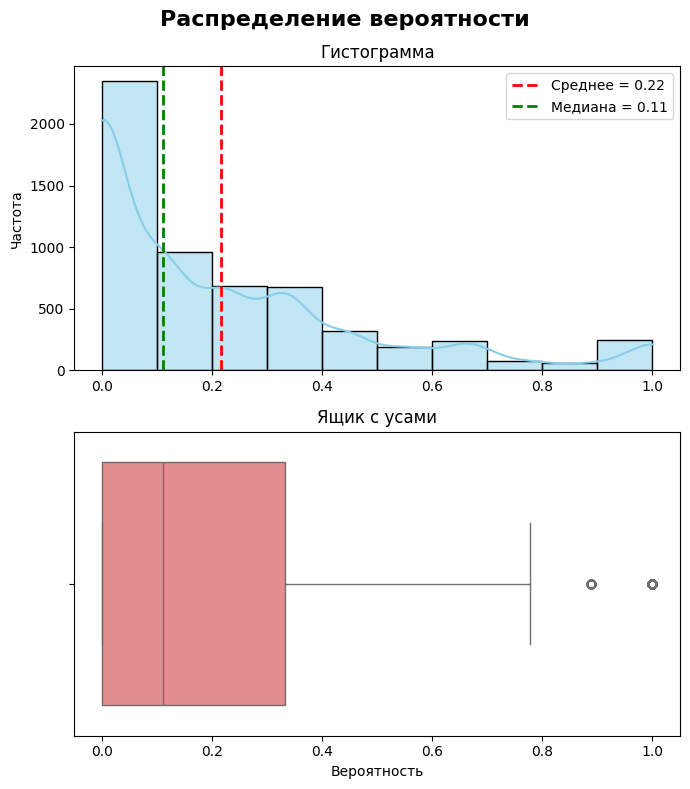

In [16]:
num_visio(df['proba'], 'Вероятность', 'Распределение вероятности', bins=10, aggs = True)

In [17]:
df['proba'].describe()

count    5822.000000
mean        0.215886
std         0.268735
min         0.000000
25%         0.000000
50%         0.111111
75%         0.333333
max         1.000000
Name: proba, dtype: float64

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/c/cf/RomanianTrafficSign_30-Stop_1971.svg/250px-RomanianTrafficSign_30-Stop_1971.svg.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
    
**Методологическая ошибка при объединении оценок и формировании целевой переменной**

В ячейке `[8]` для объединения экспертных и краудсорсинговых оценок пропуски заполняются нулями через `df.fillna(0)`, после чего рассчитывается итоговая метрика по формуле псевдо-голосования:

```python
df = df.fillna(0)
df['true_score'] = 1 * (df['expert_1'] + df['expert_2'] + df['expert_3'] - 3) + df['crowd_good']
df['false_score'] = 1 * (12 - df['expert_1'] - df['expert_2'] - df['expert_3'] ) + df['crowd_bad']
df['proba'] = df['true_score'] / (df['true_score'] + df['false_score'])

```

Данный подход приводит к серьезному искажению целевой переменной:

1. **Неравномерный знаменатель:** Краудсорсинговая разметка присутствует только у ~40% объектов выборки, а у остальных 60% эти поля содержат пропуски. Заполнение пропусков нулями приводит к тому, что у пар без крауда знаменатель равен строго 9 (только экспертные баллы), а у пар с краудом знаменатель увеличивается до 12 (9 экспертных + 3 краудсорсинговых голоса).


2. **Искажение весов оценок:** Одинаковые экспертные мнения получают разный итоговый таргет исключительно из-за факта наличия или отсутствия крауд-разметки. Например, если эксперты единогласно ставят высший балл (4, 4, 4), то без крауда пара получает оценку $9 / 9 = 1.0$, а при наличии крауда с минимальным сомнением одного разметчика (2 «за», 1 «против») оценка искусственно падает до $11 / 12 \approx 0.92$. Целевая переменная становится несопоставимой между объектами выборки.



**Как исправить:**
Необходимо исключить использование фиктивных нулей и привести обе шкалы к прозрачному виду:

* Перевести среднюю экспертную оценку в диапазон от 0 до 1 по стандартной формуле: `target_expert = (mean_expert - 1) / 3`.
* Обрабатывать разметку по правилу приоритета: если присутствуют оба источника, использовать взвешенное среднее (например, `0.6 * target_expert + 0.4 * ratio`), а при отсутствии крауд-разметки опираться строго на масштабированную экспертную оценку `target_expert`.
 
---
    
Хотя самое простое - вообще оказаться от крауд оценок. Намек об этом содержится в зеленом комментарии выше    
    
</div>

**Вывод** \
Полученная целевая переменная находится в требуемом диапазоне от 0 до 1. Среднее значение proba равно 0,22, медиана — 0,11, а 75% наблюдений имеют значение не выше 0,33. Следовательно, в данных преобладают пары с низким соответствием текста изображению. Это необходимо учитывать при оценке модели: одного среднего значения ошибки недостаточно для понимания качества ранжирования наиболее релевантных изображений.

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

`Есть 2 способа удалить изображение: `
 1. Использовать модель распознавания лица, чтобы найти ребенка
 2. Удалить те изображения, у которых вероятность соответсвия описания и изображения более 0.4 (т.к. действительно важно удалить каждое изображение) и при этом в тексте упоминается "child", "kid", "little boy" и тд. Но тут может быть несколько вариантов:
    - В комментарии не указан ребенок
    - В комментарии ошибочно указан ребенок или указана крылатая фраза, например child-free\
  Будем использовать вариант 2.

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>комментарий студента</b></font>
   
Поменял логику нахождения фото с детьми

</div>

Кол-во уникальных фото по id: 268


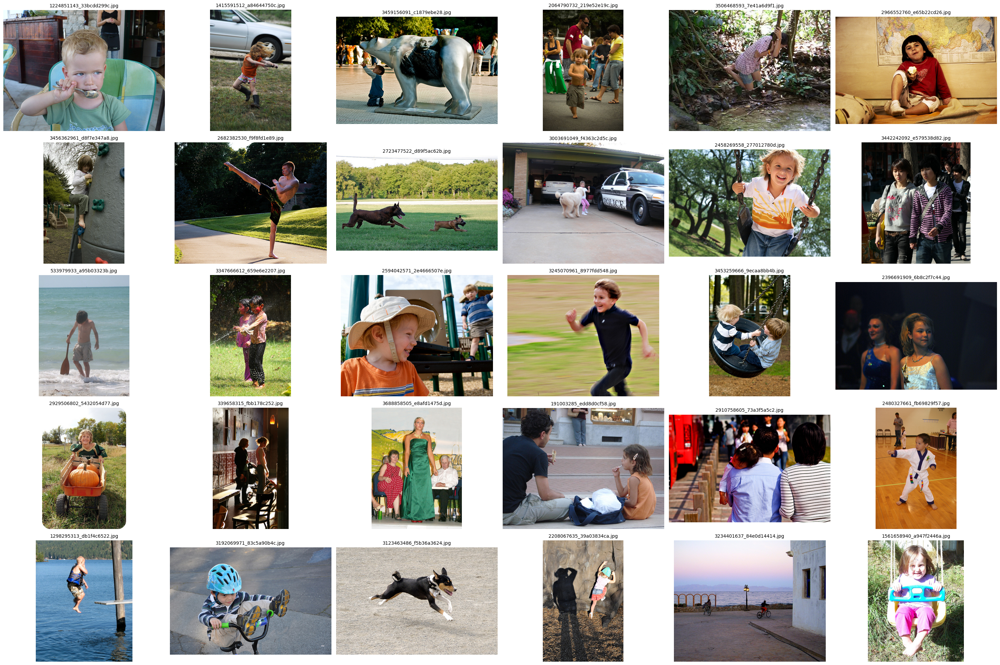

In [18]:
np.random.seed(42)
child_keywords = [
    'child', 'children', 'kid', 'kids', 'little', 'young',
    'baby', 'toddler', 'infant', 'teenager', 'teen', 'young girl',
    'young boy', 'daughter', 'son', 'girl', 'boy', 'childhood',
    'preschooler', 'kindergartener', 'schoolgirl', 'schoolboy'
]

def contains_kid(text):
    text_lower = text.lower().split()
    return any(kw in text_lower for kw in child_keywords)

df_to_explain = df.copy()
df_to_explain['is_child'] = df['query_text'].apply(contains_kid)

kid_images = df_to_explain[df_to_explain['is_child']==True]['query_id'].str.split('#').str[0].unique()

print('Кол-во уникальных фото по id:', len(kid_images))

n_images = 30
cols = 6  
rows = (n_images + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
axes = axes.flatten()

for i, img_name in enumerate(np.random.choice(kid_images, size=n_images, replace=False)):
    img_path = os.path.join(train_img_dir, img_name)
    image = Image.open(img_path)
    axes[i].imshow(image)
    axes[i].axis('off')
    axes[i].set_title(img_name, fontsize=10)

plt.tight_layout()
plt.show()

In [19]:
print(f"Доля фото с детьми: {df_to_explain[df_to_explain['image'].isin(kid_images)]['image'].nunique()/df['image'].nunique() * 100}%") 
df_filtered = df[~df['image'].isin(kid_images)]
df_filtered.info()

Доля фото с детьми: 26.8%
<class 'pandas.core.frame.DataFrame'>
Index: 4213 entries, 0 to 5821
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4213 non-null   object 
 1   query_id    4213 non-null   object 
 2   query_text  4213 non-null   object 
 3   expert_1    4213 non-null   int64  
 4   expert_2    4213 non-null   int64  
 5   expert_3    4213 non-null   int64  
 6   proba       4213 non-null   float64
dtypes: float64(1), int64(3), object(3)
memory usage: 263.3+ KB


 <img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
    
**Оптимизация фильтрации нежелательного визуального контента**

Применение порога релевантности для связки текста и изображения — логичный шаг, снижающий риск ложных срабатываний по случайным отрицательным парам. Однако текущая реализация сохраняет уязвимость: если фотография содержит ребенка, но сопоставлена с нейтральным описанием (например, пейзаж, животное или техника), такое изображение не распознается текстовым фильтром и остается в выборке.  Это подтверждается и статистикой. Ты нашел всего 164 изображения с детьми, тогда как обычно удаляется около 30%.

В структуре идентификаторов описаний заложен удобный ориентир: поле `query_id` имеет формат `<имя_файла_источника>#<порядковый_номер>`. Часть до символа `#` напрямую указывает на оригинальную фотографию, для которой изначально создавался текст.

**Рекомендация по улучшению пайплайна:**

1. Найти все текстовые описания, содержащие ключевые слова детской тематики.
2. Извлечь из их `query_id` имена исходных файлов — это дает точный список изображений, гарантированно содержащих детей.
3. Исключить из обучающего набора абсолютно все строки, где данные файлы встречаются в столбце `image` (вне зависимости от текста описания конкретной пары).

Такой подход позволяет полностью зачистить выборку от запрещенных кадров, даже если в обучающей строке они сопоставлены с абстрактной или посторонней подписью.

</div>


**Вывод**:\
По ключевым словам обнаружено 268 изображений, потенциально содержащих детей, что составляет 26,7% исходного набора изображений. После их исключения в обучающей таблице осталось 4 213 пары «изображение — текст». Метод подходит для демонстрационного решения, однако может давать ложные срабатывания.

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>комментарий студента</b></font>
   Изменил ResNet50 на ResNet18. Особого прироста в качестве не увидел, но стало отрабатывать чуть быстрее

</div>

```

def loader(df, path, batch_size=16):
    datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
    flow = datagen.flow_from_dataframe(
        dataframe=df,
        directory=path,
        x_col='image',
        y_col=None,
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode=None,
        seed=42,
        shuffle=False)
    return flow

def create_model(input_shape=(224, 224, 3)):
    backbone = ResNet50(
        input_shape=input_shape,
        weights='imagenet',
        include_top=False,
        pooling='avg'   
    )
    return backbone

def extract_image_embeddings(model, flow, num_images):
    steps = int(np.ceil(num_images / flow.batch_size))
    embeddings = model.predict(
        flow,
        steps=steps,
        verbose=1)
    embeddings = embeddings[:num_images]
    return embeddings.astype(np.float32)

# Создаём модель
model = create_model()

# Загружаем данные
unique_train_images = df_filtered[['image']].drop_duplicates().reset_index(drop=True)
train_flow = loader(unique_train_images, train_img_dir, batch_size=32)
train_embeddings = extract_image_embeddings(model, train_flow, len(unique_train_images))

print("Размер выхода ResNet50:", model.output_shape)
print("Уникальных train-изображений:", len(unique_train_images))
print("Найдено train-файлов:", train_flow.samples)
print("train_embeddings:", train_embeddings.shape)

train_image_vectors = {
    filename: embedding
    for filename, embedding in zip(
        train_flow.filenames,
        train_embeddings
    )
}

print("Векторов train:", len(train_image_vectors))

# Для каждой строки исходного DataFrame находим вектор соответствующего изображения.
train_mapped_vectors = df_filtered["image"].map(train_image_vectors)
X_train_image = np.stack(train_mapped_vectors.to_numpy()).astype(np.float32)

print("X_train_image:", X_train_image.shape)
```

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Отлично, вектра для изображений получены👍 </div>

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">

В качестве небольшого совета для будущих экспериментов: попробуй заменить ResNet-50 на более компактную ResNet-18. Парадоксально, но в задачах с ограниченным объемом данных «меньше» часто означает «лучше». Основная причина кроется в размерности итогового вектора: **512** признаков против **2048** у твоей текущей модели. 



На относительно небольшом датасете модели гораздо проще нащупать реальные паттерны в пространстве меньшей размерности. Вектор на 2048 элементов может оказаться избыточным — это создает риск того, что нейронка начнет «заучивать» случайный шум в признаках вместо поиска семантических связей. Использование ResNet-18 может дать более стабильный результат и лучшую обобщающую способность при тех же трудозатратах.

</div>

In [20]:


class ImageDataset(Dataset):
    def __init__(self, df, image_dir, transform):
        self.images = df["image"].tolist()
        self.image_dir = image_dir
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        filename = self.images[idx]
        image_path = os.path.join(self.image_dir, filename)
        image = Image.open(image_path).convert("RGB")
        image = self.transform(image)
        
        return image, filename


def loader(df, path, batch_size=16):
    weights = ResNet18_Weights.DEFAULT
    dataset = ImageDataset(
        df=df,
        image_dir=path,
        transform=weights.transforms()
    )

    return DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=0
    )


def create_model():
    weights = ResNet18_Weights.DEFAULT
    model = resnet18(weights=weights)
    model.fc = torch.nn.Identity()
    model.eval()
    return model


def extract_image_embeddings(model, data_loader):
    embeddings = []
    filenames = []

    with torch.inference_mode():
        for images, batch_filenames in data_loader:
            batch_embeddings = model(images)
            embeddings.append(batch_embeddings.numpy())
            filenames.extend(batch_filenames)

    embeddings = np.concatenate(embeddings).astype(np.float32)

    return embeddings, filenames

In [21]:
unique_train_images = (df_filtered[["image"]].drop_duplicates().reset_index(drop=True))
train_loader = loader(unique_train_images,train_img_dir,batch_size=32,)
model = create_model()
train_embeddings, filenames = extract_image_embeddings(model,train_loader)

print("Уникальных изображений:", len(unique_train_images))
print("train_embeddings:", train_embeddings.shape)  # (U, 512)

train_image_vectors = {filename: embedding for filename, embedding in zip(filenames, train_embeddings)}
train_mapped_vectors = df_filtered["image"].map(train_image_vectors)

X_train_image = np.stack(train_mapped_vectors.to_numpy()).astype(np.float32)

print("X_train_image:", X_train_image.shape)  

Уникальных изображений: 732
train_embeddings: (732, 512)
X_train_image: (4213, 512)


**Вывод**:\
Использовали ResNet18 для векторизации изображений. Получили размер вектора на тренировочной выборке = (4213, 512)


## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [22]:
lemmatizer = WordNetLemmatizer()
pos_mapping = {
    "J": wordnet.ADJ,
    "V": wordnet.VERB,
    "N": wordnet.NOUN,
    "R": wordnet.ADV
}

def clean_text(text):
    if pd.isna(text):
        return ""
    text = str(text).lower()
    text = re.sub(r"[^a-z\s]", " ", text)
    tokens = text.split()
    tagged_tokens = nltk.pos_tag(tokens,lang="eng")
    lemmas = []
    for word, tag in tagged_tokens:
        wordnet_pos = pos_mapping.get(tag[0],wordnet.NOUN)
        lemma = lemmatizer.lemmatize(word,pos=wordnet_pos)
        lemmas.append(lemma)

    return " ".join(lemmas)

    
# Создаём векторизатор
tfidf = TfidfVectorizer(
    max_features=5000,
    min_df=2,
    max_df=0.90,
    dtype=np.float32,
    stop_words='english',
    ngram_range=(1, 2)
)
# Получаем очищенные текста
train_clean_text = df_filtered['query_text'].apply(clean_text)

print("Пример очистки текста:")
print("Исходный текст:")
print(df_filtered['query_text'].iloc[0])

print("\nОчищенный текст:")
print(train_clean_text.iloc[0],'\n')

X_train_text = tfidf.fit_transform(train_clean_text).toarray()

print("X_train_text:", X_train_text.shape)

Пример очистки текста:
Исходный текст:
A young child is wearing blue goggles and sitting in a float in a pool .

Очищенный текст:
a young child be wear blue goggles and sit in a float in a pool 

X_train_text: (4213, 3895)


 <img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">


</div>


<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Подсвечу желтым, чтобы не потерялось.
    
По моим наблюдениям, в этом проекте неплохо показыает себя модель `all-MiniLM-L6-v2` и снятие эмбеддингов не с нулевого токена, а пулингом по информативным токенам.
    
Запустить её можно либо через transformers, либо через sentence-transformers    
    
https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2    
</div>

**Вывод** \
Тексты приведены к нижнему регистру, от символов и лемматизированы с учётом части речи. TF-IDF учитывает униграммы и биграммы, удаляет английские стоп-слова и оставляет 3 895 признаков. 

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [23]:

union_vector_train = np.concatenate((X_train_image, X_train_text), axis=1)
target = np.array(df_filtered[['proba']])

print('Размер тренировочной матрицы',union_vector_train.shape)
print('Размер таргета',target.shape)

Размер тренировочной матрицы (4213, 4407)
Размер таргета (4213, 1)


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Вектора, полученные из текста и изображения объеденены👍 </div>

**Вывод.** \
Признаки изображения и текста объединены по столбцам. Итоговая матрица содержит 4213 объекта и 4407 признаков.

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [24]:
X = df_filtered.drop(columns=['proba'])
y = df_filtered['proba']

gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=X, y=y, groups=df_filtered['image']))

X_train = union_vector_train[train_indices]
X_valid = union_vector_train[test_indices]

y_train = target[train_indices]
y_valid = target[test_indices]

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, благодаря использованию GroupShuffleSplit ты исключаешь попадание одного изображения в обучающий и валидационный наборы.</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
    

Пропущен важный шаг — масштабирование признаков. 
    
**Для бустинга это не критично**, но вот при использовании линейных моделей или нейронной сети это  обязательное действие, отсутствие которого напрямую повлиет на твои результат, например нейронная сеть может обучаться медленнее и нестабильнее, также возмжоны проблемы с обычными линейными моделями.

Однако просто взять обычный `StandardScaler` здесь было бы ошибкой. Этот инструмент отлично подходит для обычных табличных данных, но он может «испортить» эмбеддинги, так как работает *поколоночно* и разрушает внутреннюю геометрию векторов, в которой и заключен весь их смысл.

Самый правильный и современный подход для твоей задачи — это **раздельная L2-нормализация** векторов перед их объединением.

Вот как это выглядит на практике:
1.  **Сначала** ты берешь все векторы изображений (из `ResNet`) и нормализуешь их отдельно с помощью `Normalizer(norm='l2')`.
2.  **Потом** ты берешь все векторы текстов (из `BERT`) и тоже нормализуешь их отдельно, своим экземпляром `Normalizer`'а.
3.  И только **после этого** ты конкатенируешь уже нормализованные векторы в единую матрицу признаков.

Что это дает? Ты приводишь оба типа векторов к сопоставимому масштабу (все они становятся векторами единичной длины), но при этом полностью сохраняешь семантическую структуру внутри каждого из пространств (пространства картинок и пространства текстов). Это самый надежный способ подготовить такие сложные признаки для модели.
    

</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">


Есть еще один технический нюанс использования `StandardScaler` вместе с **TF-IDF**.

**Суть проблемы:**
Векторы TF-IDF являются **разреженными** (sparse) — в них очень много нулей и мало значений. Это позволяет хранить их в памяти очень эффективно.
`StandardScaler` по умолчанию работает с параметром `with_mean=True`. Это значит, что он вычитает среднее значение из каждого элемента.
* Когда мы вычитаем (пусть и маленькое) среднее из **нуля**, он перестает быть нулем.
* **Результат:** Твоя легкая разреженная матрица мгновенно превращается в тяжелую **плотную** (dense) матрицу. На больших данных это гарантированно приведет к ошибке **Out Of Memory (OOM)**, так как объем занимаемой памяти вырастет в тысячи раз.

**Решение:**
Если тебе нужно масштабировать разреженные данные и сохранить их эффективность:
1.  Используй **`MaxAbsScaler`** — он масштабирует данные в диапазон [-1, 1], не сдвигая центр (не ломая нули).
2.  Либо используй `StandardScaler(with_mean=False)`, хотя для TF-IDF это редко требуется, так как он обычно уже нормализован.
</div>

In [25]:

baseline_predictions = np.full(shape=len(y_valid), fill_value=np.mean(y_train),dtype=np.float32)
baseline_mae = mean_absolute_error(y_valid, baseline_predictions)

baseline_rmse = np.sqrt(mean_squared_error(y_valid, baseline_predictions))

print(f"Baseline MAE:  {baseline_mae:.4f}")
print(f"Baseline RMSE: {baseline_rmse:.4f}")


Baseline MAE:  0.2233
Baseline RMSE: 0.2814


In [26]:
%%time

xgb_model = XGBRegressor(
    objective="reg:squarederror",
    n_estimators=1000,
    learning_rate=0.03,
    max_depth=8,
    subsample=0.9,
    colsample_bytree=0.9,
    reg_alpha=0.1,
    reg_lambda=1,
    gamma=0,
    min_child_weight=11,
    tree_method="hist",
    early_stopping_rounds=50,
    eval_metric="mae",
    random_state=42,
    n_jobs=-1
)


xgb_model.fit(
    X_train,
    y_train,
    eval_set=[(X_valid, y_valid)],
    verbose=100)

xgb_valid_predictions = xgb_model.predict(X_valid)
xgb_valid_predictions = np.clip(xgb_valid_predictions,0,1)

xgb_mae = mean_absolute_error(y_valid,xgb_valid_predictions)
xgb_rmse = np.sqrt(mean_squared_error(y_valid,xgb_valid_predictions))
xgb_r2 = r2_score(y_valid,xgb_valid_predictions)

print(f"XGBoost MAE:  {xgb_mae:.4f}")
print(f"XGBoost RMSE: {xgb_rmse:.4f}")
print(f"XGBoost R²:   {xgb_r2:.4f}")


[0]	validation_0-mae:0.22249
[100]	validation_0-mae:0.18070
[200]	validation_0-mae:0.17674
[300]	validation_0-mae:0.17498
[400]	validation_0-mae:0.17343
[500]	validation_0-mae:0.17231
[600]	validation_0-mae:0.17144
[700]	validation_0-mae:0.17075
[800]	validation_0-mae:0.16993
[900]	validation_0-mae:0.16947
[999]	validation_0-mae:0.16899
XGBoost MAE:  0.1688
XGBoost RMSE: 0.2290
XGBoost R²:   0.3370
CPU times: total: 18min
Wall time: 1min 36s


Код ниже выполнятся более 40 минут, после выполненения были взяты параметры лучшей модели
```
%%time

xgb_model2 = XGBRegressor(
    objective="reg:squarederror",
    n_estimators=200,
    tree_method="hist",
    #early_stopping_rounds=20,
    #eval_metric="mae",
    random_state=123,
    n_jobs=-1
)
param_distributions = {
    "learning_rate": [0.01, 0.03, 0.1],
    "max_depth": [3,4,5,6,7,8, 9],
    "min_child_weight": [1,2,3,4,5,9,10, 11],
    "subsample": [0.6, 0.7, 0.9],
    "colsample_bytree": [0.5, 0.7, 0.9],
    "gamma": [0, 0.2, 0.5, 0.8],
    "reg_alpha": [0.01, 0.1, 0.5, 1, 3],
    "reg_lambda": [0.1, 0.5, 1, 5, 10, 15]
}


group_cv = GroupKFold(n_splits=3)
groups_train = X["image"].to_numpy()

random_search = RandomizedSearchCV(
    estimator=xgb_model2,
    param_distributions=param_distributions,
    n_iter=20,
    scoring="neg_mean_absolute_error",
    cv=group_cv,
    refit=True,
    n_jobs=1,
    verbose=2,
    random_state=123
)

random_search.fit(union_vector_train, target, groups=groups_train)
model2 = random_search.best_estimator_
random_search.best_params_
print(f"Лучший средний CV MAE: {-random_search.best_score_:.4f}")
```

In [27]:
pd.DataFrame({
    'Модель':['Предсказание среднего','XGB'],
    'MAE':[baseline_mae, xgb_mae],
    'RMSE':[baseline_rmse, xgb_rmse ]
})


,Модель,MAE,RMSE
0,Предсказание среднего,0.223330,0.281444
1,XGB,0.168769,0.229042


<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">

**Совет: выбор модели и тип представления текста 💡**

Решение через градиентный бустинг поверх TF-IDF — рабочее, и итоговое качество поиска это подтверждает. Это не случайность: TF-IDF даёт **разреженное** высокоразмерное представление, где каждый признак — это конкретное слово/n-грамма с понятной осью. Деревянные ансамбли отлично работают с такими разреженными признаками (режут по отдельным координатам-словам), поэтому связка «бустинг + TF-IDF» на текстах часто оказывается сильным и дешёвым baseline — нейросеть здесь не факт что дала бы прирост.

Момент, на который стоит обратить внимание: акцент этого спринта — освоить именно **нейросетевой** подход, так что показать нейросетевой вариант хотя бы рядом было бы правильно с точки зрения учебной цели. Требовать этого красным я не буду — в формулировке задания есть неоднозначность, а по существу твоё решение корректно и обосновано.

Что важно унести на будущее — **выбор модели должен идти от типа представления текста**:
- разреженное (TF-IDF, bag-of-words) → деревья/бустинг и линейные модели естественны и конкурентны;
- **плотные** эмбеддинги  → сигнал «размазан» по всем координатам вектора, у отдельной оси нет смысла «слова», и деревьям не за что зацепиться. Здесь нейросеть уже не «одна из опций», а практически необходимый инструмент — она и рассчитана на работу в плотном непрерывном пространстве.

Иными словами: на TF-IDF твой бустинг уместен, а как только переходишь к плотным эмбеддингам — по-хорошему нужна нейросеть.
</div>

**Вывод** 
 - Данные разделены в пропорции 70:30 с группировкой по имени изображения. Такое разбиение предотвращает утечку данных и даёт более честную оценку способности модели работать с новыми изображениями.
 - Константная модель, предсказывающая среднее значение целевой переменной, получила MAE = 0.22 и RMSE = 0.28. Эти значения используются как нижняя граница качества: обучаемая модель должна показать меньшую ошибку, иначе использование объединённых признаков изображения и текста не даёт преимущества.
 - XGBoost получил MAE = 0.16, RMSE = 0.22. По сравнению с константной моделью MAE уменьшилась примерно на 27%, а RMSE — на 21%. Следовательно, модель действительно извлекает полезную зависимость из признаков текста и изображения.
 - Для основной оценки выбрана MAE, поскольку она измеряется в единицах таргета и легко интерпретируется.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

```
random_queries = test_q['query_text'].drop_duplicates().sample(n=10, random_state=42).reset_index(drop=True)
clean_q = random_queries.apply(clean_text)
X_text = tfidf.transform(clean_q).toarray().astype(np.float32)
print("Размер X_text:", X_text.shape)


unique_images = test_im[['image']].drop_duplicates().reset_index(drop=True)
flow = loader(unique_images, test_img_dir, batch_size=32)
X_image = extract_image_embeddings(model, flow, len(unique_images)).astype(np.float32)
print("Размер X_image:", X_image.shape)
```

In [28]:
random_queries = test_q['query_text'].drop_duplicates().sample(n=10, random_state=42).reset_index(drop=True)
clean_q = random_queries.apply(clean_text)
X_text = tfidf.transform(clean_q).toarray().astype(np.float32)
print("Размер X_text:", X_text.shape)

unique_images = test_im[["image"]].drop_duplicates().reset_index(drop=True)
flow = loader(unique_images, test_img_dir, batch_size=32,)
X_image, _ = extract_image_embeddings(model, flow)

X_image = X_image.astype(np.float32)
print("Размер X_image:", X_image.shape)

Размер X_text: (10, 3895)
Размер X_image: (100, 512)


In [29]:
total_df = pd.merge(
    random_queries.reset_index().rename(columns={'index': 'text_id'}),
    unique_images.reset_index().rename(columns={'index': 'image_id'}),
    how ='cross')

text_ids = total_df["text_id"].to_numpy()
image_ids = total_df["image_id"].to_numpy()

X_image_total = X_image[image_ids]
X_text_total = X_text[text_ids]

print("X_image_total:", X_image_total.shape)
print("X_text_total:", X_text_total.shape)

union_vector = np.concatenate((X_image_total, X_text_total), axis=1)

print("union_vector:", union_vector.shape)

X_image_total: (1000, 512)
X_text_total: (1000, 3895)
union_vector: (1000, 4407)


In [30]:
preds = np.clip(xgb_model.predict(union_vector), 0, 1)
total_df['preds'] = preds
top_3_results = (
    total_df
    .sort_values(["text_id", "preds"],ascending=[True, False])
    .groupby("text_id",group_keys=False)
    .head(3)
    .reset_index(drop=True)
)

print("Размер результата:", top_3_results.shape)


Размер результата: (30, 5)


<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>комментарий студента</b></font>
   Добавил дисклеймеры 

</div>

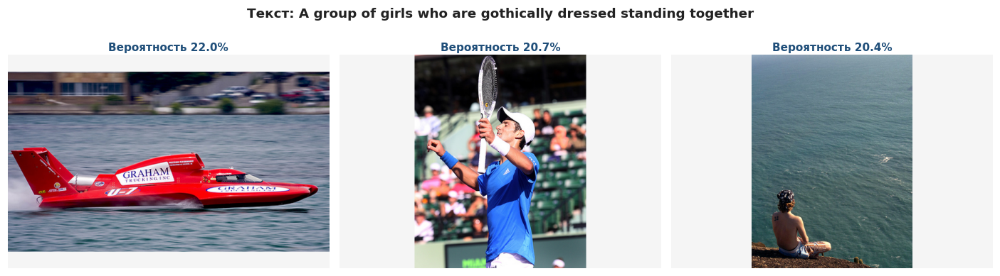

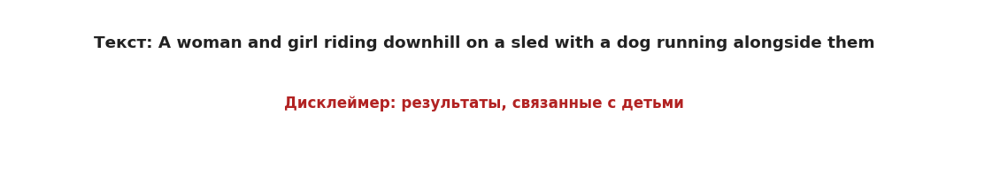

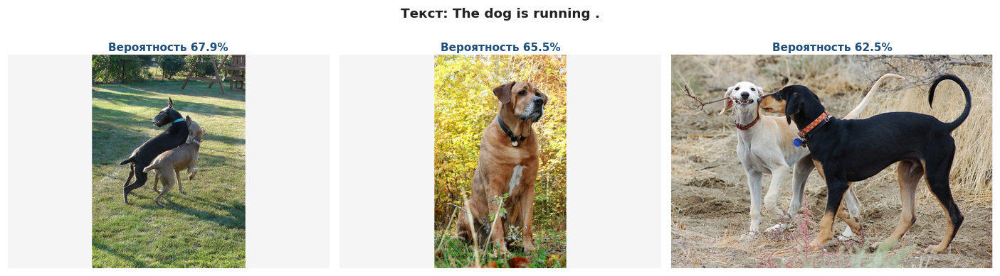

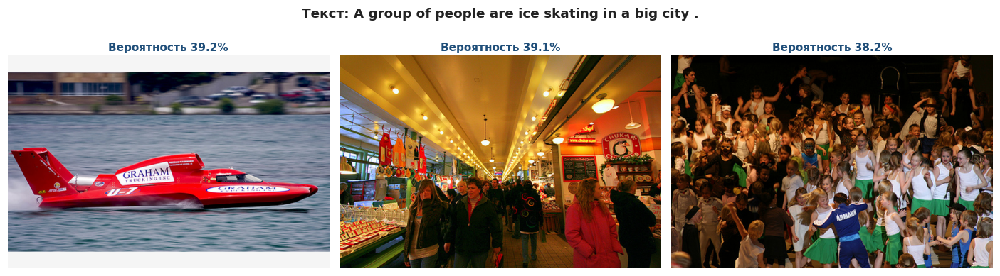

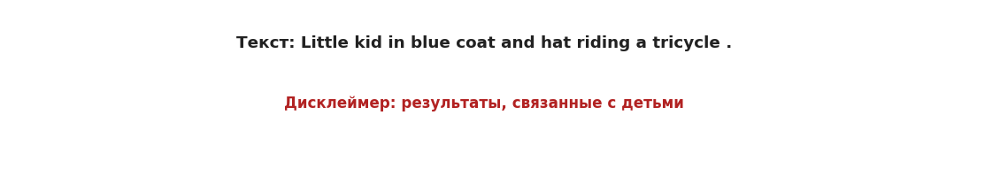

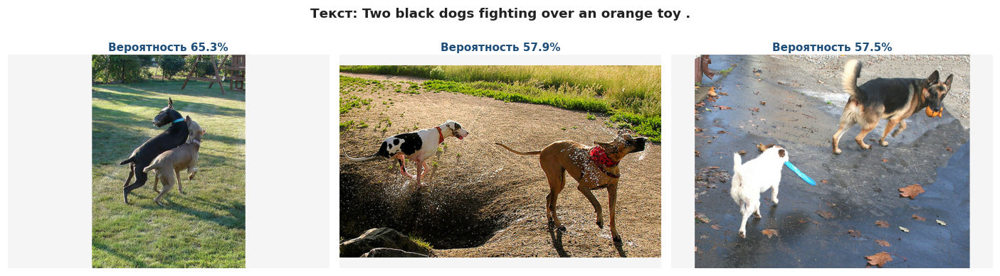

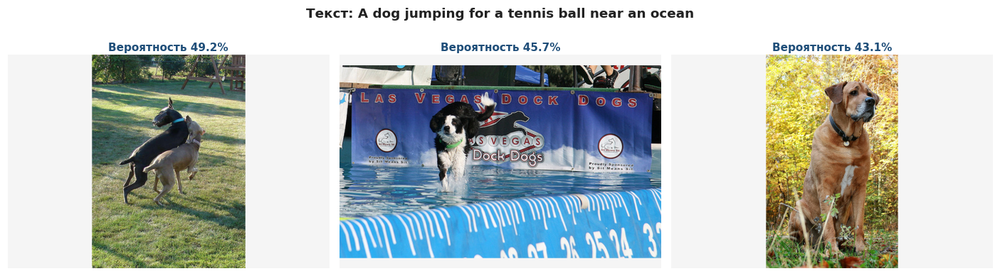

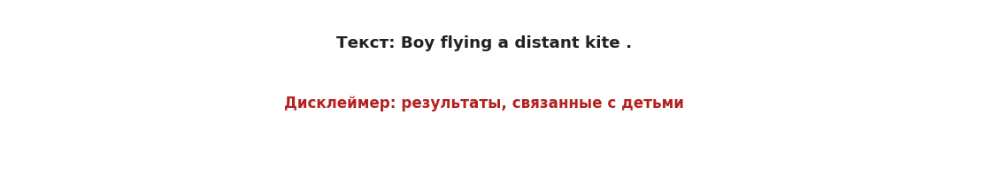

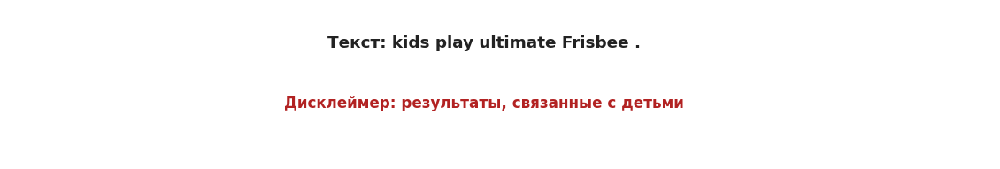

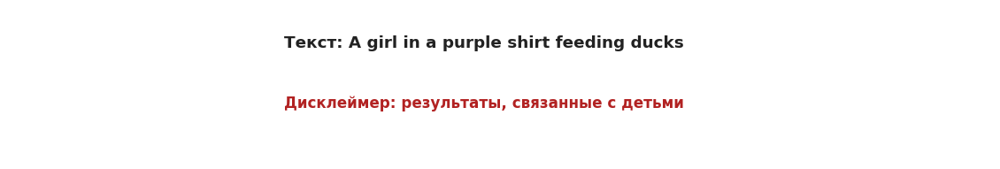

In [31]:

def prepare_image(image_path, size=(600, 400)):
    with Image.open(image_path) as image:
        image = image.convert("RGB")
        image = ImageOps.pad(
            image,
            size=size,
            method=Image.Resampling.LANCZOS,
            color=(245, 245, 245),
            centering=(0.5, 0.5)
        )

        return np.asarray(image)



for text_id, group in top_3_results.groupby("text_id",sort=True):
    group = (group.sort_values("preds",ascending=False).reset_index(drop=True))
    query_text = group["query_text"].iloc[0]
    wrapped_text = textwrap.fill(query_text,width=110)
    child_related = contains_kid(query_text)
    

    if child_related:
        fig = plt.figure(figsize=(13, 2), dpi=110)

        fig.text(
            x=0.5,
            y=0.75,
            s=f"Текст: {wrapped_text}",
            ha="center",
            va="top",
            fontsize=12,
            fontweight="bold",
            color="#222222",
        )

        fig.text(
            x=0.5,
            y=0.4,
            s="Дисклеймер: результаты, связанные с детьми",
            ha="center",
            va="center",
            fontsize=11,
            fontweight="semibold",
            color="#b22222",
        )

        plt.axis("off")
        plt.show()
        plt.close(fig)

        continue

        
    fig, axes = plt.subplots(nrows=1,ncols=3,figsize=(13, 3.8),dpi=110)
   
    fig.text(
        x=0.5,
        y=0.96,
        s=f"Текст: {wrapped_text}",
        ha="center",
        va="top",
        fontsize=12,
        fontweight="bold",
        color="#222222"
    )
    

    for rank, (axis, (_, row)) in enumerate(zip(axes, group.iterrows()),start=1):
        image_path = os.path.join(test_img_dir,row["image"])
        image_array = prepare_image(image_path,size=(600, 400))
        axis.imshow(image_array)
        axis.axis("off")
        axis.set_title(
            f"Вероятность {row['preds']*100:.1f}%",
            fontsize=10,
            fontweight="semibold",
            color="#1f4e79",
            pad=4
        )

    fig.subplots_adjust(
        left=0.015,
        right=0.985,
        bottom=0.08,
        top=0.80,
        wspace=0.025
    )

    plt.show()
    plt.close(fig)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
    
Функции написаны и со своей задачей справляются. Принимают на вход текст и находят изображение. ~Отрабатывают контроль "запрещенного контента".~

И кстати, связка TF-IDF + бустинг сработали неплохо.  По крайней мере модельчетко отделает людей от собак.
    
----------------
    
Как правило хороший результат в этом проекте удается достичь при выполнении следующих условий
    
 - использование экспертных оценок   
 - векторизация изображений через pytorch, как есть в теории к спринту  (но с отрезанием только одного слоя)
 - эмбеддинги через bert (лучший результат дает модель  `all-MiniLM-L6-v2`)
 - раздельная l2 нормализация эмбеддингов       
 - упорное обучение нейронки (иногда тысячи эпох, в любом случае пока лосс снижается) с тщательным подбором гиперпараметров.   
    
</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/c/cf/RomanianTrafficSign_30-Stop_1971.svg/250px-RomanianTrafficSign_30-Stop_1971.svg.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
    
Небольшая формальность. Пожалуйста добафь функционал,чтобы при поступлении запроса связанного с деьми выдавался дисклеймер    
</div>

<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Идеи и альтернативные подходы</b>
  Если хочешь получить хорошо работающее решение без обучения, то можешь провести эксперимент с нейронной сетью CLIP от OPEN AI (это не обязательно, только если хочешь добиться хороших результатов в этом проекте).

  Про эту нейронку много где написано, но можешь посмотреть например вот здесь  https://habr.com/ru/post/539312/.

  А для написания  реализации наиболее удобной лично для меня оказалась библиотека sbert. https://www.sbert.net/examples/applications/image-search/README.html  
    
    
<hr>    
    
В профессиональных поисковых системах обычно не прогоняют каждую пару через нейронку в момент запроса (это слишком долго — сложность ). Вместо этого:

1. Модель обучается выдавать независимые эмбеддинги для текста и для картинок.
2. Эмбеддинги картинок сохраняются в специальную базу данных.
3. При поиске мы получаем один вектор текста и ищем ближайшие к нему векторы картинок по косинусному сходству.

Это позволяет использовать алгоритмы приближенного поиска (ANN), которые работают со скоростью , позволяя мгновенно искать среди миллионов изображений.

    
   
</div>

**Вывод** 
 - Для демонстрации случайно выбраны 10 уникальных запросов.
 - Всего сформировано 1 000 комбинаций: каждый из 10 запросов сопоставлен с каждым из 100 изображений.
 - Для каждого запроса показаны три изображения в порядке убывания предсказанной вероятности
 - При запросе, связанным с детьми, выводится дисклеймер
 - В целом видно, что модель не случайно угадывает. Модель распознает группы людей, собак и тд. Однако необходимо добавить детей в обучающий набор данных

## 8. Выводы

В проекте построен полный прототип поиска изображений по текстовому запросу. Экспертная и краудсорсинговая разметка объединена в целевую оценку соответствия от 0 до 1. Из обучающего набора исключены 268 изображения, потенциально подпадающие под юридические ограничения, после чего осталось 4213 обучающих пары.

Изображения представлены 512 признаками ResNet50, а тексты — 3895 TF-IDF-признаками после очистки и лемматизации. После объединения получена матрица из 4407 признаков. Групповое разбиение по изображениям исключило попадание одного изображения одновременно в обучение и валидацию.

XGBoost достиг MAE = 0.16 и RMSE = 0.22 против 0.22 и 0.28 у константной модели. Снижение ошибок примерно на 27% и 21% соответственно подтверждает, что объединённые признаки содержат полезную информацию о соответствии текста изображению. 

На тестовом этапе для 10 случайных запросов оценены все 100 изображений. Для каждого запроса выведены три фотографии с наибольшей прогнозируемой вероятностью. 

Демонстрация полностью удалась


- [x]  Jupyter Notebook открыт
- [ ]  Весь код выполняется без ошибок
- [ ]  Ячейки с кодом расположены в порядке исполнения
- [ ]  Исследовательский анализ данных выполнен
- [ ]  Проверены экспертные оценки и краудсорсинговые оценки
- [ ]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [ ]  Изображения векторизованы
- [ ]  Текстовые запросы векторизованы
- [ ]  Данные корректно разбиты на тренировочную и тестовую выборки
- [ ]  Предложена метрика качества работы модели
- [ ]  Предложена модель схожести изображений и текстового запроса
- [ ]  Модель обучена
- [ ]  По итогам обучения модели сделаны выводы
- [ ]  Проведено тестирование работы модели
- [ ]  По итогам тестирования визуально сравнили качество поиска